In [7]:
import nltk
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import string
import text2emotion as te
import warnings
#import eda
warnings.filterwarnings("ignore")

In [2]:
df_train=pd.read_csv('train.csv')
df_train

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1
...,...,...,...,...,...
20795,20795,Rapper T.I.: Trump a ’Poster Child For White S...,Jerome Hudson,Rapper T. I. unloaded on black celebrities who...,0
20796,20796,"N.F.L. Playoffs: Schedule, Matchups and Odds -...",Benjamin Hoffman,When the Green Bay Packers lost to the Washing...,0
20797,20797,Macy’s Is Said to Receive Takeover Approach by...,Michael J. de la Merced and Rachel Abrams,The Macy’s of today grew from the union of sev...,0
20798,20798,"NATO, Russia To Hold Parallel Exercises In Bal...",Alex Ansary,"NATO, Russia To Hold Parallel Exercises In Bal...",1


## DATA CLEANING

### Removing NaNs

In [3]:
df_train.isna().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [4]:
df_train=df_train.dropna()
df_train=df_train.reset_index()
df_train.drop(['index','id'],axis=1,inplace=True)
df_train.isna().sum()

title     0
author    0
text      0
label     0
dtype: int64

### Normalizing Text

In [5]:
#PREPROCESSING USING REGULAR EXPRESSION
def clean_texts(text):
    text = re.sub(r"that’s","that is",text)
    text = re.sub(r"there’s","there is",text)
    text = re.sub(r"what’s","what is",text)
    text = re.sub(r"where’s","where is",text)
    text = re.sub(r"it’s","it is",text)
    text = re.sub(r"who’s","who is",text)
    text = re.sub(r"i’m","i am",text)
    text = re.sub(r"she’s","she is",text)
    text = re.sub(r"he’s","he is",text)
    text = re.sub(r"they’re","they are",text)
    text = re.sub(r"who're","who are",text)
    text = re.sub(r"ain’t","am not",text)
    text = re.sub(r"wouldn’t","would not",text)
    text = re.sub(r"shouldn’t","should not",text)
    text = re.sub(r"can’t","can not",text)
    text = re.sub(r"couldn’t","could not",text)
    text = re.sub(r"won’t","will not",text)
    text = re.sub(r"didn’t","did not",text)
    text = re.sub(r"doesn’t","does not",text)
    # remove URL
    text = re.sub(r"http\S+", " ", text)
#     # Remove usernames
    text = re.sub(r"@[^\s]+[\s]?",' ',text)
#     # remove special characters 
    text = re.sub('[^ a-zA-Z0-9]', ' ', text)
#     # remove Numbers
    text = re.sub('[0-9]', '', text)
    text = re.sub(' +', ' ',text)
    text = text.encode('ascii', 'ignore').decode()
    text = re.sub(r'@\S+', ' ', text)
    text = re.sub(r'#\S+', ' ', text)
    text = re.sub(r'\'\w+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text)
    text = re.sub(r'\w*\d+\w*', '', text)
    text = re.sub(r'\s{2,}', ' ', text)

    return text

In [6]:
df_train['text'] = df_train['text'].apply(clean_texts)
df_train

,title,author,text,label
0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide We Didn t Even See Comey s Lett...,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,Why the Truth Might Get You Fired,Consortiumnews.com,Why the Truth Might Get You Fired October The ...,1
3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos Civilians Killed In Single US Airstrike...,1
4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print An Iranian woman has been sentenced to s...,1
...,...,...,...,...
18280,Rapper T.I.: Trump a ’Poster Child For White S...,Jerome Hudson,Rapper T I unloaded on black celebrities who m...,0
18281,"N.F.L. Playoffs: Schedule, Matchups and Odds -...",Benjamin Hoffman,When the Green Bay Packers lost to the Washing...,0
18282,Macy’s Is Said to Receive Takeover Approach by...,Michael J. de la Merced and Rachel Abrams,The Macy s of today grew from the union of sev...,0
18283,"NATO, Russia To Hold Parallel Exercises In Bal...",Alex Ansary,NATO Russia To Hold Parallel Exercises In Balk...,1


### Stop Words Removal

In [7]:
from nltk.corpus import stopwords
stops = set(stopwords.words("english")) 
df_train['text']=df_train['text'].str.lower()
df_train['text']=df_train['text'].apply(lambda x:' '.join([word for word in x.split() if word.lower() not in (stops)]))
df_train

,title,author,text,label
0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,house dem aide even see comey letter jason cha...,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,ever get feeling life circles roundabout rathe...,0
2,Why the Truth Might Get You Fired,Consortiumnews.com,truth might get fired october tension intellig...,1
3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,videos civilians killed single us airstrike id...,1
4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,print iranian woman sentenced six years prison...,1
...,...,...,...,...
18280,Rapper T.I.: Trump a ’Poster Child For White S...,Jerome Hudson,rapper unloaded black celebrities met donald t...,0
18281,"N.F.L. Playoffs: Schedule, Matchups and Odds -...",Benjamin Hoffman,green bay packers lost washington redskins wee...,0
18282,Macy’s Is Said to Receive Takeover Approach by...,Michael J. de la Merced and Rachel Abrams,macy today grew union several great names amer...,0
18283,"NATO, Russia To Hold Parallel Exercises In Bal...",Alex Ansary,nato russia hold parallel exercises balkans pr...,1


In [8]:
df_train=df_train.dropna()
df_train=df_train.reset_index()
df_train.drop(['index'],axis=1,inplace=True)
df_train.isna().sum()

title     0
author    0
text      0
label     0
dtype: int64

### Dropping authors who contains both real and fake

In [9]:
df_train_fake=df_train[['author']].loc[df_train['label'] == 1]
df_train_real=df_train[['author']].loc[df_train['label'] == 0]
df_train_real=df_train_real['author'].tolist()
df_train_fake=df_train_fake['author'].tolist()
filtered_authors_list=list(set(df_train_real).symmetric_difference(set(df_train_fake)))

In [10]:
filtered_authors_list

['Rachele Marmetti',
 'YouKnowWho',
 'Matthew Rosenberg and Adam Goldman',
 'Outis Philalithopoulos',
 'Renee Parsons',
 'Victor Mather, Karen Crouse and Doug Mills',
 'Евстахий Стахович',
 'Kevin Sack and Alan Blinder',
 'Breitbart News, Amanda House, Jerome Hudson, Rebecca Mansour',
 'Matt Barber',
 'Alexandra Stevenson and Matthew Goldstein',
 'Jennifer Steinhauer and Matt Flegenheimer',
 'Stephanie Kuklish',
 'Alexander Burns and Thomas Kaplan',
 'Dennis Overbye and Sewell Chan',
 'Relampago Furioso',
 'Sarah Maslin Nir and Al Baker',
 'Nicholas Fandos and Mike Isaac',
 'Anonymous Coward (UID 1786283)',
 'Admin - Orissa',
 'Bugs Bunny',
 'Branko Mali',
 'Karen Zraick, Karen Workman and Sandra Stevenson',
 'Maggie Haberman, Ashley Parker, Jeremy W. Peters and Michael Barbaro',
 'Lawrence K. Altman',
 'Jeremy R. Hammond',
 'Alison Smale and James Kanter',
 'Henry Wolff',
 'Gal Beckerman',
 'Jonah Engel Bromwich and Dolores Morrison',
 'Billy Witz',
 'Ariel Noyola Rodríguez',
 'Joe Co

## Feature Engineering

### Author Feature Vector

In [11]:

# df_train[df_train['author'].str.contains("Dan Pringle")]
# df_train[df_train['author'].isin(filtered_authors_list)]
df_train_filtered=pd.DataFrame()
for x in filtered_authors_list:
    df_train_filtered=df_train_filtered.append(df_train[df_train['author'] == x])
df_train_filtered=df_train_filtered.reset_index()
df_train_filtered.drop(['index'],axis=1,inplace=True)
df_train_filtered

,title,author,text,label
0,Il Regno Unito riprende l’addestramento degli ...,Rachele Marmetti,il regno unito riprende l addestramento degli ...,1
1,Comment on We have a winner! by YouKnowWho,YouKnowWho,dr eowyn comment fotm th caption contest think...,1
2,U.S. Rescue Attempt in Afghanistan Missed West...,Matthew Rosenberg and Adam Goldman,washington navy seals led unsuccessful raid la...,0
3,Democrats Confront F.B.I. Chief at Closed-Door...,Matthew Rosenberg and Adam Goldman,washington america intelligence chiefs sat mem...,0
4,Liberalism Yet To Come: The Boundaries of the ...,Outis Philalithopoulos,outis philalithopoulos yesterday episode serie...,1
...,...,...,...,...
18002,"Breaking Trust, Breaking the Bank - The Inside...",John Helmer,reality check media breaking trust breaking ba...,1
18003,Heavy Snowfall Is Forecast Across Northeastern...,Liam Stack and Jess Bidgood,maybe thought going get winter without much ro...,0
18004,Commander-In-Chief Donald Trump Will Have Terr...,Alex Eammons,written alex eammons donald trump becomes comm...,1
18005,Comment on 6 Things Indian Guys Have To Unders...,Game Is A Modern Rite Of Passage That Helps Tu...,home month popular things indian guys understa...,1


In [12]:
from textblob import TextBlob

In [13]:
author_list=df_train_filtered['author'].unique().tolist()

# Not mandatory

In [14]:


df_train_feature_vector=pd.DataFrame()
for a in author_list:
    author_loop=df_train_filtered.loc[df_train_filtered['author'] == a]
    author_title_len=len(author_loop['title'].unique())
    polarity=0
    for x in author_loop['text']:
        blob = TextBlob(x)
        polarity=polarity+list(blob.sentiment)[0]
    feature_value=polarity/author_title_len
    author_loop['Author_feature_value']=feature_value
    df_train_feature_vector=df_train_feature_vector.append(author_loop)
df_train_feature_vector

,title,author,text,label,Author_feature_value
0,Google Self-Driving Car Unit Accuses Uber of U...,Daisuke Wakabayashi and Mike Isaac,san francisco waymo car business spun google p...,0,0.019980
1,"In Race Against Fake News, Google and Facebook...",Daisuke Wakabayashi and Mike Isaac,san francisco google facebook taking steps cur...,0,0.019980
2,Comment on New Moon In Scorpio: Making A Calcu...,New Moon In Scorpio: Making A Calculated Effor...,share facebook share twitter new moon scorpio ...,1,0.169701
3,Why Palestinians Want To Sue Britain: 99 Years...,Ramzy Baroud,share last july palestinian authority took une...,1,-0.004562
4,The war on UNESCO: Al-Aqsa Mosque is Palestini...,Ramzy Baroud,war unesco al aqsa mosque palestinian east jer...,1,-0.004562
...,...,...,...,...,...
18002,FEMA Opens Loan Window As Red Cross Tries To S...,Brandon Turbeville,brandon turbeville floodwaters receded nichols...,1,0.176631
18003,Is American Food Killing Us? Author Brandon Tu...,Brandon Turbeville,natural blaze brandon turbeville made fascinat...,1,0.176631
18004,A Tale Of Two Cities: Mosul And Aleppo,Brandon Turbeville,brandon turbeville past days western corporate...,1,0.176631
18005,U.S. Takes A Stab At A No Fly Zone In Two Plac...,Brandon Turbeville,brandon turbeville united states marches forwa...,1,0.176631


### Text2Emotion

In [15]:
lst=[]
for x in range(len(df_train_feature_vector['text'])):
    print(x)
    dt=dict(te.get_emotion(df_train_feature_vector['text'][x]))
    dt_sort = sorted(dt.items(), key=lambda x: x[1], reverse=True)
    lst.append(dt_sort[0][0])
df_train_feature_vector['emotion']=lst
df_train_feature_vector

In [16]:
# df_train_feature_vector.to_csv('till_text2emotion.csv',index=False)

<AxesSubplot:>

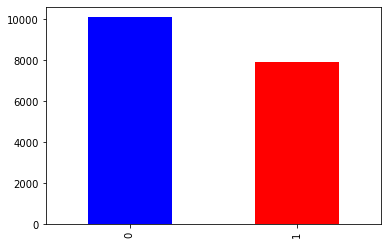

In [17]:
df_train_feature_vector['label'].value_counts().plot(kind='bar',color=['b','r'])

## Named Entity Recognition

In [13]:
df_train_feature_vector=pd.read_csv('till_text2emotion.csv')

In [14]:
import spacy

In [15]:
NER = spacy.load("en_core_web_sm")

In [16]:
df_train_feature_vector.dropna(inplace=True)
df_train_feature_vector.reset_index(drop=True,inplace=True)

In [17]:
lst=[]
for x in range(len(df_train_feature_vector['text'])):
    y=NER(df_train_feature_vector['text'][x])
    lst.append(len(y.ents))
lst

In [18]:
df_train_feature_vector['NER']=lst
df_train_feature_vector

In [19]:
df_train_feature_vector.to_csv('till_NER.csv',index=False)

# Stylometry

In [3]:
df=pd.read_csv('till_NER.csv')
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35
...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22


## TextBlob Sentiment Polarity & Subjectivity 

In [4]:
from nltk.corpus import sentiwordnet as swn
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [5]:
def analyze_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0:
        return 'positive'
    elif analysis.sentiment.polarity == 0:
        return 'neutral'
    else:
        return 'negative'

In [6]:
df=df.dropna()
df['text'].isna().sum()

0

In [7]:
df['sentiment']=df['text'].apply(analyze_sentiment)

In [8]:
def textblob_polarity(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

In [9]:
df['textblob_polarity']=df['text'].apply(textblob_polarity)
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155
...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738


In [10]:
def textblob_subjectivity(text):
    analysis = TextBlob(text)
    return analysis.sentiment.subjectivity

In [11]:
df['textblob_subjectivity']=df['text'].apply(textblob_subjectivity)
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636
...,...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928


## Vader Sentiment

In [12]:
sid=SentimentIntensityAnalyzer()

In [13]:
df['VaderValues']=df['text'].apply(lambda x: sid.polarity_scores(x))

In [32]:
df['sentiment_compound_polarity']=df['VaderValues'].apply(lambda x: x['compound'])

In [33]:
#df['VaderScore']=df['VaderScore'].apply(lambda score: 'positive' if score >= 0.05 else('negative' if score <= -0.05  else 'neutral')) 
df.loc[df.sentiment_compound_polarity>=0.05,'VaderScore']='positive'
df.loc[df.sentiment_compound_polarity<=-0.05,'VaderScore']='negative'
df.loc[(df.sentiment_compound_polarity>-0.05) & (df.sentiment_compound_polarity<0.05) ,'VaderScore']='neutral'


In [34]:
df=df.drop(columns=('sentiment_compound_polarity'), axis=0)
df=df.drop(columns=('VaderValues'), axis=0)
df.dropna()
# df.to_csv('./Sent.csv',index=False)

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity,VaderScore
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322,positive
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713,negative
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205,negative
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787,positive
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636,positive
...,...,...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785,negative
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596,positive
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644,positive
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928,positive


## Count no of quotations in each sentence

In [35]:
def get_quotes(text):
    quotes = re.findall(r" '(.*?)'",text)
    return len(quotes)

In [36]:
df['no_of_quotes']=df['raw_text'].apply(get_quotes)
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322,positive,0
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713,negative,0
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205,negative,0
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787,positive,0
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636,positive,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785,negative,0
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596,positive,0
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644,positive,0
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928,positive,0


## Count no of unique words in each sentence

In [37]:
def unique_words_sent(text):
    results = set()
    results.update(text.lower().split())
    return (len(results))

In [38]:
df['no_of_unique_words']=df['text'].apply(unique_words_sent)
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322,positive,0,178
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713,negative,0,272
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205,negative,0,188
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787,positive,0,154
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636,positive,0,203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785,negative,0,268
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596,positive,0,316
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644,positive,0,222
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928,positive,0,211


## Count no of words in each sentence

In [39]:
from nltk.tokenize import sent_tokenize


In [40]:
def no_of_words(text):
    sent=sent_tokenize(text)
    return len(sent[0].split(' '))
    

In [41]:
df['no_of_words']=df['text'].apply(no_of_words)
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322,positive,0,178,247
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713,negative,0,272,364
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205,negative,0,188,249
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787,positive,0,154,237
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636,positive,0,203,288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785,negative,0,268,383
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596,positive,0,316,451
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644,positive,0,222,305
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928,positive,0,211,282


## Count the no of unique authors

In [42]:
def no_of_unique_authors(text):
    return len(re.split(', | and ',text))

In [43]:
df['no_of_unique_authors']=df['author'].apply(no_of_unique_authors)
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322,positive,0,178,247,1
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713,negative,0,272,364,1
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205,negative,0,188,249,1
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787,positive,0,154,237,1
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636,positive,0,203,288,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18002,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785,negative,0,268,383,1
18003,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596,positive,0,316,451,2
18004,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644,positive,0,222,305,1
18005,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928,positive,0,211,282,1


In [44]:
# df.to_csv('Final_training_data.csv',index=False)

In [3]:
df=pd.read_csv('Final_training_data.csv')
df

,title,author,raw_text,text,label,Author_feature_value,emotion,NER,sentiment,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors
0,America Votes Against Empire,Dan Wright,There’s no way to sweep this under the rug: th...,way sweep rug american people voted end empire...,1,0.033027,Surprise,44,positive,0.062159,0.340322,positive,0,178,247,1
1,"Dear Hillary Supporters, Own Your Terrible Can...",Dan Wright,Despite the establishment media’s hopes and re...,despite establishment media hopes repeated cla...,1,0.033027,Fear,35,negative,-0.128710,0.508713,negative,0,272,364,1
2,US Condemnation Of Yemen Slaughter Backfires A...,Dan Wright,Once called the world’s greatest purveyor of v...,called world greatest purveyor violence revere...,1,0.033027,Fear,33,positive,0.045186,0.472205,negative,0,188,249,1
3,Goldman Sachs Endorses Hillary Clinton For Pre...,Dan Wright,Goldman Sachs Endorses Hillary Clinton For Pre...,goldman sachs endorses hillary clinton preside...,1,0.033027,Fear,31,positive,0.029116,0.360787,positive,0,154,237,1
4,JPMorgan Pays $264 Million Fine For Bribing Ch...,Dan Wright,"JPMorgan is, once again, paying money out to f...",jpmorgan paying money federal regulators chron...,1,0.033027,Fear,35,positive,0.029155,0.432636,positive,0,203,288,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17914,Florida Woman Charged in Death of Infant in ‘C...,Christine Hauser,"Early on Oct. 6, Erin was awakened by the so...",early oct erin awakened sound baby crying late...,0,0.041488,Fear,21,positive,0.024529,0.348785,negative,0,268,383,1
17915,"Hearing ‘America First,’ European Nations Jock...",Rachel Donadio and Liam Stack,PARIS — First it was the Netherlands. After...,paris first netherlands president trump vowed ...,0,0.179949,Surprise,54,positive,0.179949,0.422596,positive,0,316,451,2
17916,Russell Moore Can’t Support Either Candidate -...,Ana Marie Cox,You have a somewhat different approach than yo...,somewhat different approach predecessors south...,0,0.093246,Fear,14,positive,0.061626,0.381644,positive,0,222,305,1
17917,Melissa Gilbert Never Saw Congress in Her Futu...,Ana Marie Cox,"As a child, you played Laura Ingalls Wilder in...",child played laura ingalls wilder tv adaptatio...,0,0.093246,Surprise,22,positive,0.167738,0.559928,positive,0,211,282,1


In [4]:
df['text']=df['author']+' '+df['text']
df['text']

0        Dan Wright way sweep rug american people voted...
1        Dan Wright despite establishment media hopes r...
2        Dan Wright called world greatest purveyor viol...
3        Dan Wright goldman sachs endorses hillary clin...
4        Dan Wright jpmorgan paying money federal regul...
                               ...                        
17914    Christine Hauser early oct erin awakened sound...
17915    Rachel Donadio and Liam Stack paris first neth...
17916    Ana Marie Cox somewhat different approach pred...
17917    Ana Marie Cox child played laura ingalls wilde...
17918    Ana Marie Cox forthcoming book tears cannot st...
Name: text, Length: 17919, dtype: object

In [5]:
col=['sentiment',
    'text',
    'Author_feature_value',
    'emotion',
    'NER',
    'textblob_polarity',
    'textblob_subjectivity',
    'VaderScore',
    'no_of_quotes',
    'no_of_unique_words',
    'no_of_words',
    'no_of_unique_authors',
    'label']
df=df[col]

In [7]:
df['label'].value_counts()

0    10095
1     7824
Name: label, dtype: int64

In [8]:
df = df.sample(frac = 1) 
df.reset_index(drop=True,inplace=True)

## Creating Test Set before Data Augmentation

In [9]:
test_one_label=df[df['label']==1].tail(1000)
test_zero_label=df[df['label']==0].tail(1000)
df.drop(test_one_label.index,inplace=True)
df.drop(test_zero_label.index,inplace=True)
df.reset_index(drop=True)

,sentiment,text,Author_feature_value,emotion,NER,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,positive,Cecilia Kang washington republican senators mo...,0.088054,Fear,53,0.052110,0.407528,positive,0,344,590,1,0
1,positive,Penelope Green thanksgiving ariel levy staff w...,0.102956,Fear,45,0.060255,0.481015,positive,0,742,1117,1,0
2,positive,Breitbart News politico reports internal clash...,0.091182,Surprise,10,0.042003,0.209764,negative,0,65,84,1,0
3,positive,Grant Stern comments former us attorney genera...,0.027764,Fear,28,0.007695,0.402725,positive,0,270,403,1,1
4,positive,Michelle Moons senate judiciary committee demo...,0.075130,Fear,37,0.029487,0.295513,negative,0,202,326,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15914,positive,Jeff Poor tuesday fox news channel fox friends...,0.015829,Surprise,10,0.092857,0.342965,positive,0,58,87,1,0
15915,negative,Bob Price largest street gang united states in...,-0.022413,Fear,64,-0.125295,0.440061,negative,0,311,492,1,0
15916,positive,Breitbart Tech breitbart news senior editor mi...,0.079786,Fear,10,0.130476,0.645476,positive,0,105,132,1,0
15917,positive,Erik Piepenburg sunrise sunset swiftly flow da...,0.109233,Fear,15,0.122283,0.377006,positive,0,331,467,1,0


In [10]:
test_set = test_one_label.append(test_zero_label, ignore_index=True)
test_set

,sentiment,text,Author_feature_value,emotion,NER,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,positive,Iron Sheik home politics comey broke stack res...,0.041988,Sad,33,0.075510,0.408404,negative,0,198,289,1,1
1,positive,Jessica Purkiss videos civilians killed single...,0.020986,Surprise,37,0.020986,0.242276,negative,0,189,305,1,1
2,positive,Truth Broadcast Network mins ago views comment...,0.104714,Surprise,7,0.041111,0.292222,positive,0,93,100,1,1
3,positive,Robin D.G. Kelley elections robin g kelley aut...,0.082413,Fear,108,0.041207,0.356482,negative,0,1378,2480,1,1
4,positive,Infowars.com hillary planning violent mob atta...,0.008991,Surprise,7,0.112500,0.490625,negative,0,58,67,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,negative,Trent Baker promoting american race new televi...,0.090692,Sad,10,-0.233058,0.462534,negative,0,72,95,1,0
1996,positive,Neil Munro president donald trump slid back ca...,0.066957,Fear,60,0.087735,0.406630,positive,0,598,1027,1,0
1997,positive,Sean Moran according politico report president...,0.085648,Fear,27,0.004386,0.207895,negative,0,163,252,1,0
1998,positive,Ian Hanchett friday broadcast fox news channel...,0.074064,Fear,18,0.195868,0.495141,positive,0,203,354,1,0


In [11]:
# df.to_excel('Sent.xlsx',index=False)k2

## Data Augmentation

In [12]:
from eda import *
def gen_eda(train_orig, sheet, alpha_sr, alpha_ri, alpha_rs, alpha_rd, num_aug):
    lines=pd.read_excel(train_orig,sheet_name=sheet)
    col_list=['sentiment','text','Author_feature_value','emotion','NER','textblob_polarity','textblob_subjectivity','VaderScore','no_of_quotes','no_of_unique_words','no_of_words','no_of_unique_authors','label']
    lines=lines[col_list]
    lines=lines.values.tolist()
    last_string = []    
    sentiment_lst=[]
    sen_lst=[]
    auth_feat_val_lst=[]
    emotion_lst = []
    NER_lst=[]
    textblob_polarity_lst=[]
    textblob_subjectivity_lst=[]
    VaderScore_lst=[]
    no_of_quotes_lst=[]
    no_of_unique_words_lst=[]
    no_of_words_lst=[]
    no_of_unique_authors_lst=[]
    label_lst=[]
    
    for i in range(len(lines)):
        sentiment = lines[i][0]
        sentence = lines[i][1]
        auth_feat_val = lines[i][2]
        emotion = lines[i][3]
        NER = lines[i][4]
        textblob_polarity = lines[i][5]
        textblob_subjectivity = lines[i][6]
        VaderScore = lines[i][7]
        no_of_quotes = lines[i][8]
        no_of_unique_words = lines[i][9]
        no_of_words = lines[i][10]
        no_of_unique_authors = lines[i][11]
        label = lines[i][12]
        
        aug_sentences = eda(sentence, alpha_sr=alpha_sr, alpha_ri=alpha_ri, alpha_rs=alpha_rs, p_rd=alpha_rd, num_aug=num_aug)
        for aug_sentence in aug_sentences:
            sentiment_lst.append(sentiment)
            sen_lst.append(aug_sentence)
            auth_feat_val_lst.append(auth_feat_val)
            emotion_lst.append(emotion)
            NER_lst.append(NER)
            textblob_polarity_lst.append(textblob_polarity)
            textblob_subjectivity_lst.append(textblob_subjectivity)
            VaderScore_lst.append(VaderScore)
            no_of_quotes_lst.append(no_of_quotes)
            no_of_unique_words_lst.append(no_of_unique_words)
            no_of_words_lst.append(no_of_words)
            no_of_unique_authors_lst.append(no_of_unique_authors)
            label_lst.append(label)

    df=pd.DataFrame(zip(sentiment_lst,sen_lst,auth_feat_val_lst,emotion_lst,NER_lst,textblob_polarity_lst,textblob_subjectivity_lst,VaderScore_lst,no_of_quotes_lst,no_of_unique_words_lst,no_of_words_lst,no_of_unique_authors_lst,label_lst),columns=col_list)
    df.to_csv('./Sent_Anal_Increased.csv',index=False)        
    print("generated augmented sentences with eda for " + train_orig + " to " + " with num_aug=" + str(num_aug))


In [13]:
path='./Sent.xlsx'
data= gen_eda(path,sheet='Sheet1',alpha_sr=0.1, alpha_ri=0.1, alpha_rs=0.1, alpha_rd=0.1, num_aug=3)

generated augmented sentences with eda for ./Sent.xlsx to  with num_aug=3


In [14]:
import pandas as pd
data=pd.read_csv('Sent_Anal_Increased.csv')
data

,sentiment,text,Author_feature_value,emotion,NER,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,positive,jason ditz putin far gone see syrian rebels se...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
1,positive,jason ditz putin still hopes see moderate john...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
2,positive,jason ditz putin still hopes see moderate rebe...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
3,positive,jason ditz putin still hopes see moderate rebe...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
4,positive,truth broadcast rt hours ago views comments re...,0.104714,Sad,3,0.136364,0.500000,positive,2,23,25,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63671,positive,lucas nolan breitbart senior editor milo appea...,0.055176,Fear,24,0.053038,0.387151,negative,0,325,497,1,0
63672,positive,michiko kakutani last year plunged alternate r...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0
63673,positive,michiko written last independent good alternat...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0
63674,positive,michiko kakutani last year plunged alternate r...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0


In [15]:
data.drop_duplicates(inplace=True)
data.reset_index(drop=True,inplace=True)

In [16]:
data.duplicated().any().any()

False

In [17]:
data

,sentiment,text,Author_feature_value,emotion,NER,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,positive,jason ditz putin far gone see syrian rebels se...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
1,positive,jason ditz putin still hopes see moderate john...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
2,positive,jason ditz putin still hopes see moderate rebe...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
3,positive,jason ditz putin still hopes see moderate rebe...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
4,positive,truth broadcast rt hours ago views comments re...,0.104714,Sad,3,0.136364,0.500000,positive,2,23,25,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63373,positive,lucas nolan breitbart senior editor milo appea...,0.055176,Fear,24,0.053038,0.387151,negative,0,325,497,1,0
63374,positive,michiko kakutani last year plunged alternate r...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0
63375,positive,michiko written last independent good alternat...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0
63376,positive,michiko kakutani last year plunged alternate r...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0


In [18]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot

## Converting text to numbers (Training)

In [19]:
vocab_size = 5000
one_hot_train = [one_hot(word,vocab_size) for word in data['text']]
one_hot_train

[[3982,
  1013,
  158,
  3587,
  404,
  2997,
  3130,
  3880,
  16,
  2572,
  4828,
  3982,
  1013,
  3874,
  3460,
  2370,
  612,
  379,
  4649,
  4951,
  1131,
  158,
  122,
  1610,
  1223,
  1832,
  2935,
  2370,
  4082,
  1709,
  586,
  3027,
  3801,
  2257,
  2370,
  4799,
  14,
  3943,
  1277,
  3589,
  3027,
  3027,
  2047,
  1013,
  3612,
  3988,
  2257,
  4799,
  4951,
  4654,
  256,
  1138,
  586,
  3602,
  2559,
  719,
  251,
  364,
  3977,
  2186,
  1709,
  1718,
  4563,
  4290,
  2032,
  1321,
  1874,
  152,
  4976,
  180,
  4828,
  4793,
  2877,
  2419,
  2779,
  2572,
  4853,
  449,
  2884,
  4365,
  1321,
  1935,
  642,
  4477,
  3586,
  2747,
  2186,
  3852,
  1749,
  3589,
  439,
  2663,
  2594,
  3586,
  3943,
  2252,
  244,
  3442,
  3565,
  2047,
  2607,
  1709,
  4563,
  1718,
  4563,
  4004,
  3319,
  4336,
  4865,
  3589,
  3027,
  2471,
  2370,
  1610,
  1223,
  2226,
  3243,
  1439,
  4605,
  4118,
  4649,
  3066,
  158,
  4477,
  3983,
  2772,
  1067,
  158,


## Converting Sentences into fixed length (Training)

In [20]:
sent_length = 20
embedd_docs_train = pad_sequences(one_hot_train,padding='pre',maxlen=sent_length)
embedd_docs_train

array([[3243, 1439, 4605, ..., 1815, 3982, 3857],
       [ 642, 1439, 4605, ..., 1815, 3982, 1013],
       [ 158,   28,  158, ..., 1815, 3982, 1013],
       ...,
       [4846,  993, 1784, ..., 1182, 1142,  579],
       [ 993, 1784, 2482, ..., 1182, 1142,  579],
       [1912,  993, 1784, ..., 1182, 1142,  579]])

### Train DataFrame

In [21]:
data

,sentiment,text,Author_feature_value,emotion,NER,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,positive,jason ditz putin far gone see syrian rebels se...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
1,positive,jason ditz putin still hopes see moderate john...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
2,positive,jason ditz putin still hopes see moderate rebe...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
3,positive,jason ditz putin still hopes see moderate rebe...,0.026859,Fear,19,0.049351,0.307359,negative,0,100,134,1,1
4,positive,truth broadcast rt hours ago views comments re...,0.104714,Sad,3,0.136364,0.500000,positive,2,23,25,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63373,positive,lucas nolan breitbart senior editor milo appea...,0.055176,Fear,24,0.053038,0.387151,negative,0,325,497,1,0
63374,positive,michiko kakutani last year plunged alternate r...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0
63375,positive,michiko written last independent good alternat...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0
63376,positive,michiko kakutani last year plunged alternate r...,0.067157,Fear,53,0.077443,0.469513,negative,0,686,937,1,0


In [22]:
df=pd.DataFrame(embedd_docs_train)
df['sentiment'] = data['sentiment']
df['Author_feature_value'] = data['Author_feature_value']
df['emotion'] = data['emotion']
df['textblob_polarity'] = data['textblob_polarity']
df['textblob_subjectivity'] = data['textblob_subjectivity']
df['VaderScore'] = data['VaderScore']
df['no_of_quotes'] = data['no_of_quotes']
df['no_of_unique_words'] = data['no_of_unique_words']
df['no_of_words'] = data['no_of_words']
df['no_of_unique_authors'] = data['no_of_unique_authors']
df['label'] = data['label']
df

,0,1,2,3,4,5,6,7,8,9,...,Author_feature_value,emotion,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,3243,1439,4605,4118,4649,3066,158,4477,3983,2772,...,0.026859,Fear,0.049351,0.307359,negative,0,100,134,1,1
1,642,1439,4605,4118,4649,158,158,4477,3983,2772,...,0.026859,Fear,0.049351,0.307359,negative,0,100,134,1,1
2,158,28,158,4477,3983,2772,1067,3066,4976,2370,...,0.026859,Fear,0.049351,0.307359,negative,0,100,134,1,1
3,642,1439,4605,4118,4649,158,158,4477,3983,2772,...,0.026859,Fear,0.049351,0.307359,negative,0,100,134,1,1
4,1860,1040,2298,4746,3852,3752,922,337,1992,2198,...,0.104714,Sad,0.136364,0.500000,positive,2,23,25,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63373,3049,4051,4060,203,4853,3494,3610,2898,1208,32,...,0.055176,Fear,0.053038,0.387151,negative,0,325,497,1,0
63374,291,36,1098,2098,993,1784,2482,73,4646,1816,...,0.067157,Fear,0.077443,0.469513,negative,0,686,937,1,0
63375,4846,993,1784,2482,73,2482,3534,2157,1816,2994,...,0.067157,Fear,0.077443,0.469513,negative,0,686,937,1,0
63376,993,1784,2482,2219,73,4646,3534,2157,1816,2994,...,0.067157,Fear,0.077443,0.469513,negative,0,686,937,1,0


## Label Encoding (Training)

In [23]:
#label_mapping = {'negative': 0, 'neutral': 1, 'positive': 2}
label_mapping = {'positive': 1,  'negative': 2, 'neutral' : 0}

df['sentiment'] = df[['sentiment']].replace(label_mapping)
df['sentiment'].value_counts()


1    50033
2    12079
0     1266
Name: sentiment, dtype: int64

In [24]:
df['VaderScore'] = df[['VaderScore']].replace(label_mapping)
df['VaderScore'].value_counts()

1    35741
2    26635
0     1002
Name: VaderScore, dtype: int64

In [25]:
label_mapping = {'Surprise': 1,  'Fear': 2, 'Sad' : 0,'Angry' : 3,'Happy' : 4}

df['emotion'] = df[['emotion']].replace(label_mapping)
df['emotion'].value_counts()

2    47823
1    10742
0     3764
4      869
3      180
Name: emotion, dtype: int64

In [26]:
# df.to_csv('Final_training.csv',index=False)

## Converting text to numbers (Test)

In [27]:
#Test
vocab_size = 5000
one_hot_test = [one_hot(word,vocab_size) for word in test_set['text']]
one_hot_test

[[2591,
  573,
  4862,
  4066,
  2375,
  1883,
  22,
  1124,
  4820,
  3628,
  3118,
  1414,
  2375,
  1883,
  22,
  1124,
  4820,
  3628,
  3118,
  1414,
  2823,
  608,
  4973,
  1507,
  3364,
  2257,
  3118,
  2139,
  549,
  2375,
  1475,
  3603,
  4832,
  3630,
  3092,
  3297,
  2043,
  4707,
  2819,
  3603,
  31,
  2051,
  965,
  3504,
  4815,
  4832,
  603,
  2819,
  1128,
  138,
  4507,
  4339,
  2586,
  3356,
  2375,
  2362,
  4737,
  4707,
  3630,
  365,
  4010,
  202,
  4924,
  2752,
  2607,
  3609,
  4210,
  3603,
  2774,
  3364,
  3771,
  1363,
  2472,
  1290,
  3979,
  1850,
  2375,
  3364,
  315,
  785,
  4962,
  746,
  3630,
  2337,
  445,
  4825,
  4363,
  2531,
  58,
  3336,
  4628,
  4505,
  3580,
  2349,
  3113,
  3714,
  63,
  4243,
  549,
  2375,
  2673,
  3346,
  28,
  440,
  136,
  4059,
  581,
  2404,
  2411,
  2555,
  1414,
  3118,
  101,
  63,
  2222,
  3673,
  556,
  2694,
  3603,
  2329,
  230,
  549,
  2375,
  2673,
  2733,
  3630,
  3603,
  4505,
  4832,
  

## Converting Sentences into fixed length (Test)

In [28]:
sent_length = 20
embedd_docs_test = pad_sequences(one_hot_test,padding='pre',maxlen=sent_length)
embedd_docs_test

array([[ 960, 1626, 2583, ..., 1955, 1521, 3436],
       [1157, 1264,  561, ..., 1585, 3030, 1540],
       [ 922,  337, 1992, ..., 1219, 2007, 1540],
       ...,
       [2148, 1229, 2517, ...,  475, 2482, 4928],
       [ 612, 1091, 4047, ..., 1110, 1445,  579],
       [1735, 1014, 1242, ...,  153, 2454,  379]])

### Test DataFrame

In [29]:
test=pd.DataFrame(embedd_docs_test)
test['sentiment'] = test_set['sentiment']
test['Author_feature_value'] = test_set['Author_feature_value']
test['emotion'] = test_set['emotion']
test['textblob_polarity'] = test_set['textblob_polarity']
test['textblob_subjectivity'] = test_set['textblob_subjectivity']
test['VaderScore'] = test_set['VaderScore']
test['no_of_quotes'] = test_set['no_of_quotes']
test['no_of_unique_words'] = test_set['no_of_unique_words']
test['no_of_words'] = test_set['no_of_words']
test['no_of_unique_authors'] = test_set['no_of_unique_authors']
test['label'] = test_set['label']
test


,0,1,2,3,4,5,6,7,8,9,...,Author_feature_value,emotion,textblob_polarity,textblob_subjectivity,VaderScore,no_of_quotes,no_of_unique_words,no_of_words,no_of_unique_authors,label
0,960,1626,2583,3144,815,3849,408,379,3857,1850,...,0.041988,Sad,0.075510,0.408404,negative,0,198,289,1,1
1,1157,1264,561,1502,1138,3980,1185,3874,4821,561,...,0.020986,Surprise,0.020986,0.242276,negative,0,189,305,1,1
2,922,337,1992,2198,322,3187,3131,3725,4409,2815,...,0.104714,Surprise,0.041111,0.292222,positive,0,93,100,1,1
3,28,957,3348,4442,2149,3746,1156,957,229,4679,...,0.082413,Fear,0.041207,0.356482,negative,0,1378,2480,1,1
4,2191,3049,1990,1763,455,440,2664,103,4023,80,...,0.008991,Surprise,0.112500,0.490625,negative,0,58,67,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,4679,612,212,1338,662,4157,612,2482,4082,80,...,0.090692,Sad,-0.233058,0.462534,negative,0,72,95,1,0
1996,4059,94,2482,3609,4201,2919,1700,3349,3265,552,...,0.066957,Fear,0.087735,0.406630,positive,0,598,1027,1,0
1997,2148,1229,2517,1781,2263,2586,1229,2517,4463,1574,...,0.085648,Fear,0.004386,0.207895,negative,0,163,252,1,0
1998,612,1091,4047,1091,2994,4497,1255,1864,1781,4497,...,0.074064,Fear,0.195868,0.495141,positive,0,203,354,1,0


## Label Encoding (Testing)

In [30]:
#label_mapping = {'negative': 0, 'neutral': 1, 'positive': 2}
label_mapping = {'positive': 1,  'negative': 2, 'neutral' : 0}

test['sentiment'] = test[['sentiment']].replace(label_mapping)
test['sentiment'].value_counts()


1    1554
2     396
0      50
Name: sentiment, dtype: int64

In [31]:
test['VaderScore'] = test[['VaderScore']].replace(label_mapping)
test['VaderScore'].value_counts()

1    1129
2     836
0      35
Name: VaderScore, dtype: int64

In [32]:
label_mapping = {'Surprise': 1,  'Fear': 2, 'Sad' : 0,'Angry' : 3,'Happy' : 4}

test['emotion'] = test[['emotion']].replace(label_mapping)
test['emotion'].value_counts()

2    1486
1     339
0     136
4      29
3      10
Name: emotion, dtype: int64

In [33]:
# test.to_csv('Final_testing.csv',index=False)

## Training (To be run from here)

In [3]:
df=pd.read_csv('Final_training.csv')
test=pd.read_csv('Final_testing.csv')

In [4]:
print(df.shape)
print(test.shape)

(63380, 31)
(2000, 31)


## Splitting Features and Label for Training

In [5]:
X_train=df.drop('label',axis=1)
y_train=df['label']

In [6]:
train_col=X_train.columns

## Normalization (Training)

In [7]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_train=pd.DataFrame(X_train,columns=train_col)

## Splitting Features and Label for Testing

In [8]:
X_test=test.drop('label',axis=1)
y_test=test['label']

In [9]:
test_col=X_test.columns

## Normalization (Testing)

In [10]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_test=scaler.fit_transform(X_test)
X_test=pd.DataFrame(X_test,columns=test_col)

## Decision Tree

In [11]:
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])

In [12]:
from sklearn.tree import DecisionTreeClassifier
dt_clf=DecisionTreeClassifier(random_state=25)
dt_clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=25)

In [13]:
dt_pred = dt_clf.predict(X_test)

In [14]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score , precision_score , recall_score , f1_score
print(confusion_matrix(y_test,dt_pred))
print(classification_report(y_test,dt_pred))
dt_acc=round(accuracy_score(y_test, dt_pred)*100)
dt_precision = round(precision_score(y_test, dt_pred)*100)
dt_recall = round(recall_score(y_test, dt_pred)*100)
dt_f1_score = round(f1_score(y_test, dt_pred)*100)

print('accuracy' ,dt_acc,'%')
print('precision,' , dt_precision , '%' )
print('recall score,' ,  dt_recall , '%' )

print('f1_score ', dt_f1_score , '%' )


[[835 165]
 [228 772]]
              precision    recall  f1-score   support

           0       0.79      0.83      0.81      1000
           1       0.82      0.77      0.80      1000

    accuracy                           0.80      2000
   macro avg       0.80      0.80      0.80      2000
weighted avg       0.80      0.80      0.80      2000

accuracy 80 %
precision, 82 %
recall score, 77 %
f1_score  80 %


## ROC-AUC

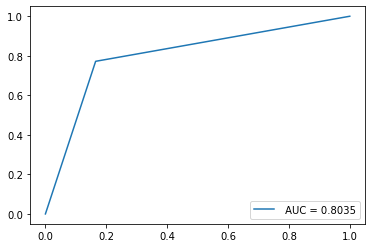

In [15]:
import matplotlib.pyplot as plt
from sklearn import metrics
y_pred_proba = dt_clf.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
dt_auc = metrics.roc_auc_score(y_test, y_pred_proba)
result_table = result_table.append({'classifiers':'Decision Tree',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':dt_auc}, ignore_index=True)
plt.plot(fpr,tpr,label=" AUC = "+str(dt_auc))
plt.legend(loc=4)
plt.show()

## Random Forest

In [16]:
from sklearn.ensemble import RandomForestClassifier

In [17]:
rf_clf=RandomForestClassifier(n_estimators=1000,random_state=25)
rf_clf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=1000, random_state=25)

In [18]:
rf_pred = rf_clf.predict(X_test)

In [19]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test,rf_pred))
print(classification_report(y_test,rf_pred))
rf_acc=round(accuracy_score(y_test, rf_pred)*100)
rf_precision=round(precision_score(y_test, rf_pred)*100)
rf_recall=round(recall_score(y_test, rf_pred)*100)
rf_f1_score=round(f1_score(y_test, rf_pred)*100)


print('accuracy' ,rf_acc,'%')
print('precision,' , rf_precision , '%' )
print('recall score,' ,  rf_recall , '%' )

print('f1_score ', rf_f1_score , '%' )

[[988  12]
 [ 55 945]]
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1000
           1       0.99      0.94      0.97      1000

    accuracy                           0.97      2000
   macro avg       0.97      0.97      0.97      2000
weighted avg       0.97      0.97      0.97      2000

accuracy 97 %
precision, 99 %
recall score, 94 %
f1_score  97 %


## ROC-AUC

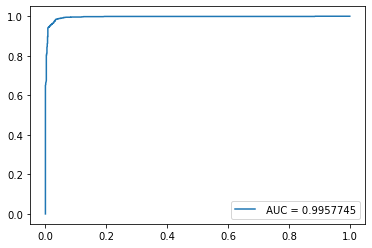

In [20]:
from sklearn import metrics
import matplotlib.pyplot as plt
y_pred_proba = rf_clf.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
rf_auc = metrics.roc_auc_score(y_test, y_pred_proba)
result_table = result_table.append({'classifiers':'Random Forest',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':rf_auc}, ignore_index=True)
plt.plot(fpr,tpr,label=" AUC = "+str(rf_auc))
plt.legend(loc=4)
plt.show()

In [21]:
lst_colors=['green','yellow', 'cyan','pink','purple', 'blue', 'grey','orange','black','red']
lst_colors.reverse()

Text(0.5, 1.0, 'Feature Importance')

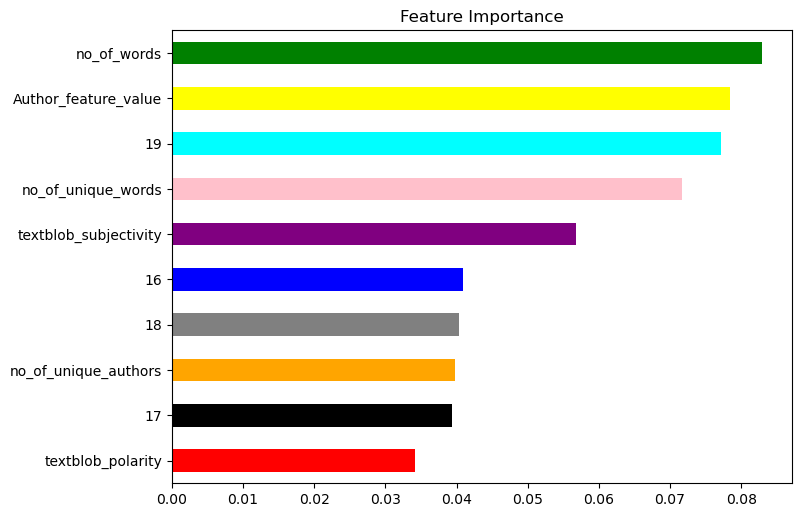

In [22]:
from matplotlib.pyplot import figure
figure(figsize=(8,6), dpi=100)
feat_importances = pd.Series(rf_clf.feature_importances_, index=X_train.columns)
feat_importances.nlargest(10).sort_values(ascending=True).plot(kind='barh',color=lst_colors)
plt.title('Feature Importance')

## Xgboost Classifier

Text(0.5, 1.0, 'Feature Importance')

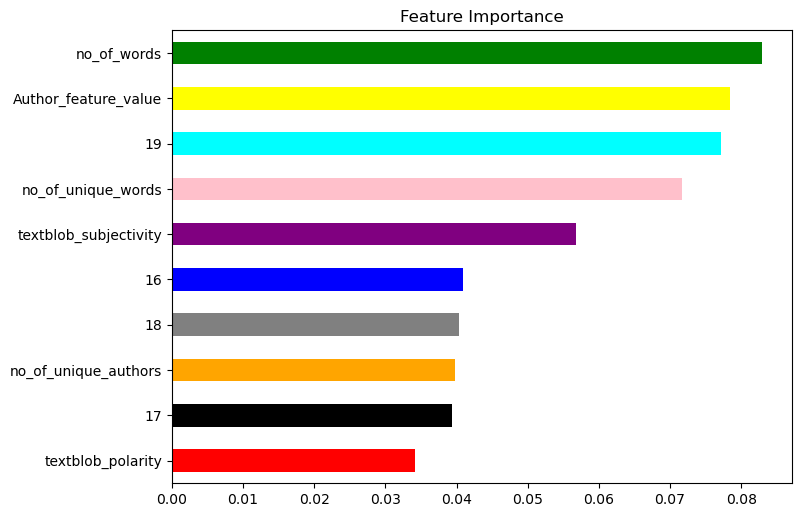

In [23]:
from matplotlib.pyplot import figure
figure(figsize=(8,6), dpi=100)
feat_importances = pd.Series(rf_clf.feature_importances_, index=X_train.columns)
feat_importances.nlargest(10).sort_values(ascending=True).plot(kind='barh',color=lst_colors)
plt.title('Feature Importance')

In [24]:
from xgboost import XGBClassifier
XG_classifier = XGBClassifier(n_estimators=1000,max_depth=30,random_state=25)
XG_classifier.fit(X_train,y_train)
xg_pred = XG_classifier.predict(X_test)

[20:58:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [26]:
print(confusion_matrix(y_test,xg_pred))
print(classification_report(y_test,xg_pred))
xg_acc=round(accuracy_score(y_test, xg_pred)*100)
print(xg_acc,'%')


xg_acc=round(accuracy_score(y_test, xg_pred)*100)
xg_precision=round(precision_score(y_test, xg_pred)*100)
xg_recall=round(recall_score(y_test, xg_pred)*100)
xg_f1_score=round(f1_score(y_test, xg_pred)*100)


print('accuracy' ,xg_acc,'%')
print('precision,' , xg_precision , '%' )
print('recall score,' ,  xg_recall , '%' )

print('f1_score ', xg_f1_score , '%' )

[[950  50]
 [ 93 907]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      1000
           1       0.95      0.91      0.93      1000

    accuracy                           0.93      2000
   macro avg       0.93      0.93      0.93      2000
weighted avg       0.93      0.93      0.93      2000

93 %
accuracy 93 %
precision, 95 %
recall score, 91 %
f1_score  93 %


## ROC-AUC 

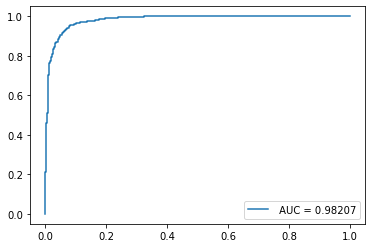

In [27]:
y_pred_proba = XG_classifier.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
xg_auc = metrics.roc_auc_score(y_test, y_pred_proba)
result_table = result_table.append({'classifiers':'Xgboost',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':xg_auc}, ignore_index=True)
plt.plot(fpr,tpr,label=" AUC = "+str(xg_auc))
plt.legend(loc=4)
plt.show()

## K-Nearest Neighbour 

In [28]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors=3)

# Train the model using the training sets
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [29]:
predicted= model.predict(X_test)

In [30]:
print(confusion_matrix(y_test,predicted))
print(classification_report(y_test,predicted))
knn_acc=round(accuracy_score(y_test, predicted)*100)
print(knn_acc,'%')
knn_acc=round(accuracy_score(y_test, predicted)*100)
knn_precision=round(precision_score(y_test, predicted)*100)
knn_recall=round(recall_score(y_test, predicted)*100)
knn_f1_score=round(f1_score(y_test, predicted)*100)


print('accuracy' ,knn_acc,'%')
print('precision,' , knn_precision , '%' )
print('recall score,' ,  knn_recall , '%' )

print('f1_score ', knn_f1_score , '%' )

[[973  27]
 [ 71 929]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1000
           1       0.97      0.93      0.95      1000

    accuracy                           0.95      2000
   macro avg       0.95      0.95      0.95      2000
weighted avg       0.95      0.95      0.95      2000

95 %
accuracy 95 %
precision, 97 %
recall score, 93 %
f1_score  95 %


## ROC-AUC 

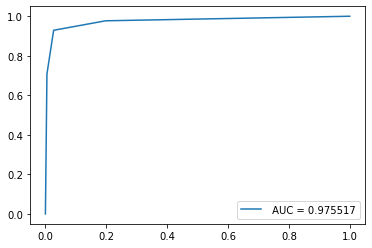

In [31]:
y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
knn_auc = metrics.roc_auc_score(y_test, y_pred_proba)
result_table = result_table.append({'classifiers':'KNN',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':knn_auc}, ignore_index=True)
plt.plot(fpr,tpr,label=" AUC = "+str(knn_auc))
plt.legend(loc=4)
plt.show()

## Adaboost Classifier

In [32]:
from sklearn.ensemble import AdaBoostClassifier    

In [33]:
clf = AdaBoostClassifier(random_state=25)
clf.fit(X_train, y_train)

AdaBoostClassifier(random_state=25)

In [34]:
ada_pred= clf.predict(X_test)

In [35]:
print(confusion_matrix(y_test,ada_pred))
print(classification_report(y_test,ada_pred))
ada_acc=round(accuracy_score(y_test, ada_pred)*100)
print(ada_acc,'%')


ada_acc=round(accuracy_score(y_test, ada_pred)*100)
ada_precision=round(precision_score(y_test, ada_pred)*100)
ada_recall=round(recall_score(y_test, ada_pred)*100)
ada_f1_score=round(f1_score(y_test, ada_pred)*100)


print('accuracy' ,ada_acc,'%')
print('precision,' , ada_precision , '%' )
print('recall score,' ,  ada_recall , '%' )

print('f1_score ', ada_f1_score , '%' )

[[841 159]
 [474 526]]
              precision    recall  f1-score   support

           0       0.64      0.84      0.73      1000
           1       0.77      0.53      0.62      1000

    accuracy                           0.68      2000
   macro avg       0.70      0.68      0.68      2000
weighted avg       0.70      0.68      0.68      2000

68 %
accuracy 68 %
precision, 77 %
recall score, 53 %
f1_score  62 %


## ROC-AUC 

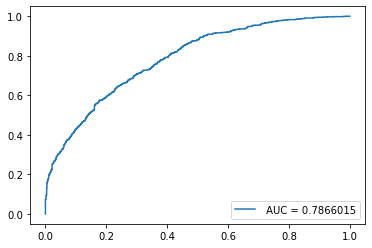

In [36]:
y_pred_proba = clf.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
ada_auc = metrics.roc_auc_score(y_test, y_pred_proba)
result_table = result_table.append({'classifiers':'Adaboost',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':ada_auc}, ignore_index=True)
plt.plot(fpr,tpr,label=" AUC = "+str(ada_auc))
plt.legend(loc=4)
plt.show()

## Logistic Regression

In [37]:
from sklearn.linear_model import LogisticRegression

In [38]:
clf1 = LogisticRegression(random_state=25)
clf1.fit(X_train, y_train)

LogisticRegression(random_state=25)

In [39]:
lr_pred= clf1.predict(X_test)

In [40]:
print(confusion_matrix(y_test,lr_pred))
print(classification_report(y_test,lr_pred))
lr_acc=round(accuracy_score(y_test, lr_pred)*100)
print(lr_acc,'%')


lr_acc=round(accuracy_score(y_test, lr_pred)*100)
lr_precision=round(precision_score(y_test, lr_pred)*100)
lr_recall=round(recall_score(y_test, lr_pred)*100)
lr_f1_score=round(f1_score(y_test, lr_pred)*100)


print('accuracy' ,lr_acc,'%')
print('precision,' , lr_precision , '%' )
print('recall score,' ,  lr_recall , '%' )

print('f1_score ', lr_f1_score , '%' )

[[846 154]
 [609 391]]
              precision    recall  f1-score   support

           0       0.58      0.85      0.69      1000
           1       0.72      0.39      0.51      1000

    accuracy                           0.62      2000
   macro avg       0.65      0.62      0.60      2000
weighted avg       0.65      0.62      0.60      2000

62 %
accuracy 62 %
precision, 72 %
recall score, 39 %
f1_score  51 %


## ROC-AUC 

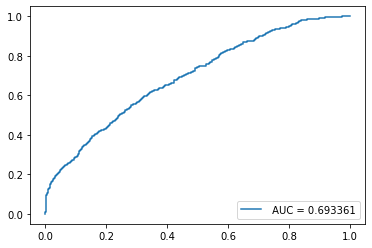

In [41]:
y_pred_proba = clf1.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
lr_auc = metrics.roc_auc_score(y_test, y_pred_proba)
result_table = result_table.append({'classifiers':'Logistic Regression',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':lr_auc}, ignore_index=True)
plt.plot(fpr,tpr,label=" AUC = "+str(lr_auc))
plt.legend(loc=4)
plt.show()

## Combined ROC-AUC

In [42]:
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

In [72]:
result_table=result_table.sort_values(by='auc',ascending=False)

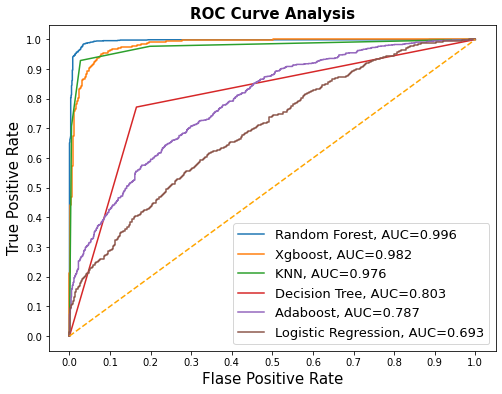

In [73]:
# plt.plot(fpr,tpr,label="Decision Tree = "+str(dt_auc))
# plt.plot(fpr,tpr,label="Random Forest = "+str(rf_auc))
# plt.plot(fpr,tpr,label="XGboost = "+str(knn_auc))
# plt.plot(fpr,tpr,label="KNN = "+str(xg_auc))
# plt.plot(fpr,tpr,label="Adaboost = "+str(ada_auc))
# plt.plot(fpr,tpr,label="Logistic Regression = "+str(lr_auc))
# plt.legend()
import numpy as np


fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

## Accuracy Chart

Text(0.5, 1.0, 'Model Accuracies')

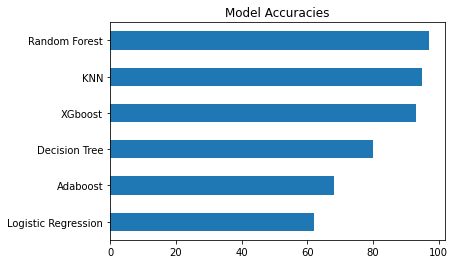

In [74]:
acc_tuple=[(dt_acc,rf_acc,xg_acc,knn_acc,ada_acc,lr_acc)]
acc_df=pd.DataFrame(acc_tuple,columns=['Decision Tree','Random Forest','XGboost','KNN','Adaboost','Logistic Regression'])
acc_df=acc_df.T
acc_df.sort_values(by=0,ascending=True).plot(legend=None,kind='barh')
plt.title('Model Accuracies')